## Installing dependencies

In [1]:
# in-built modules
from pathlib import Path

# dependencies packages
import cv2

import time
import os

## Config Params

In [2]:
# Video file
VIDEO_DIRPATH = "C:\\awilde\\britta\\LTU\\SkiingProject\\SkiersProject\\Data"
VIDEO_PATH_ANNOTATED = "C:\\Users\\britt\\OneDrive - Luleå University of Technology\\SkiersProject\\Code\\SkiersProject\\resultsMMPose\\video_output\\visualizations"

selected_files = ["DJI_0024.MP4", "DJI_0027.MP4", "DJI_0022.MP4", "DJI_0047.MP4", "DJI_0048.MP4", "DJI_0032.MP4", "DJI_0041.MP4"]

# Frame settings
REQUIRED_FRAME_RATE = 0.2

START_FROM_SECOND = 8
# For example: 2 means, start extraction of the frames after 2 seconds of the video is passed.

END_SECOND = 10

REQUIRED_IMAGE_FORMAT = 'jpg'
REQUIRED_IMAGE_WIDTH = 720

# Output frames dirpath
OUTDIR = "./extractedFrames"
OUTDIR_ANNOTATED = "./extractedFrames/annotated"

VERBOSE = False

## Frame Extractor

In [3]:
class FrameExtractor:
    def __init__(self, vid, out_dir, img_frmt, required_frame_rate, start_from_seconds, end_seconds, img_width, verbose):
        self.vid = vid
        self.out_dir = out_dir
        self.img_frmt = img_frmt
        self.required_frame_rate = required_frame_rate or 1
        self.start_from_seconds = start_from_seconds or 0
        self.end_seconds = end_seconds or 0
        self.img_width = img_width
        self.verbose = verbose

    def create_dir_if_not_exists(self, dirname: str):
        """Create a directory with the specified name inside the 'out_dir'
        directory if it doesn't exist.

        :param dirname: Name of the directory to be created.
        :return: created dir path.
        """
        target_dir = Path.joinpath(self.out_dir, dirname)
        if not target_dir.exists():
            target_dir.mkdir(parents=True, exist_ok=True)
        else:
            return target_dir
        return target_dir

    def extract_frames(self):
        """Extract frames from a video."""
        count = 1

        vid_cap = cv2.VideoCapture(str(Path(self.vid)))
        frames = int(vid_cap.get(cv2.CAP_PROP_FRAME_COUNT)) - 1
        fps = int(vid_cap.get(cv2.CAP_PROP_FPS))
        try:
            seconds = int(frames/fps)
        except ZeroDivisionError as ex:
            print("Unable to detect seconds")
            seconds = 1

        if self.verbose:
            print("======================================")
            print(f"[OUT FILE DIRECTORY] - {self.out_dir}")
            print(f"[TOTAL FRAMES] - {frames}")
            print(f"[FRAMES PER SECOND] - {fps}")
            print(f"[VIDEO LENGTH] - {seconds} seconds")
        # start from 1 if 'start_from_seconds' is not passed.
        sec = int(self.start_from_seconds)
        vid_cap.set(cv2.CAP_PROP_POS_MSEC, sec * 1000)
        vidname = self.vid.stem

        orig_file_dir = self.create_dir_if_not_exists('orig_size_frames')
        #resize_file_dir = self.create_dir_if_not_exists('re_size_frames')
        while (vid_cap.isOpened()):
            success, image = vid_cap.read()
            if success:
                try:
                    orig_file_location = f"{orig_file_dir}/{vidname}_{count}.{self.img_frmt}"
                    #resize_file_location = f"{resize_file_dir}/{vidname}_{count}.{self.img_frmt}"

                    # Write orig size image
                    cv2.imwrite(orig_file_location, image)

                    # Resize and write the image
                    #img = cv2.resize(image, self.img_width)
                    #cv2.imwrite(resize_file_location, img)

                    print(f"Done: {count}")
                except Exception as ex:
                    print("[ERROR CODE 1001]")
                    print(ex)
            else:
                print(
                    f"Done extracting frames: {count - 1} orig & {count - 1} resized frames extracted.")
                break

            count += 1
            sec += self.required_frame_rate
            if sec > self.end_seconds: 
                break
            vid_cap.set(cv2.CAP_PROP_POS_MSEC, sec * 1000)
            
        vid_cap.release()

In [11]:
# width and height (considering 16:9 format)
img_width = REQUIRED_IMAGE_WIDTH, int((REQUIRED_IMAGE_WIDTH*9)/16)

out_dir = Path(OUTDIR)

# leave out videos that have mistakes
for file in selected_files[:-2]:
    vid = os.path.join(VIDEO_DIRPATH, file)
    vid = Path(vid)
    frm_ext = FrameExtractor(vid,
                                                  out_dir,
                                                  REQUIRED_IMAGE_FORMAT,
                                                  REQUIRED_FRAME_RATE,
                                                  START_FROM_SECOND ,
                                                  END_SECOND,
                                                  img_width,
                                                  VERBOSE)
    frm_ext.extract_frames()

DJI_0024.MP4
C:\awilde\britta\LTU\SkiingProject\SkiersProject\Data\DJI_0024.MP4
Done: 1
Done: 2
Done: 3
Done: 4
Done: 5
Done: 6
Done: 7
Done: 8
Done: 9
Done: 10
Done: 11
DJI_0027.MP4
C:\awilde\britta\LTU\SkiingProject\SkiersProject\Data\DJI_0027.MP4
Done: 1
Done: 2
Done: 3
Done: 4
Done: 5
Done: 6
Done: 7
Done: 8
Done: 9
Done: 10
Done: 11
DJI_0022.MP4
C:\awilde\britta\LTU\SkiingProject\SkiersProject\Data\DJI_0022.MP4
Done: 1
Done: 2
Done: 3
Done: 4
Done: 5
Done: 6
Done: 7
Done: 8
Done: 9
Done: 10
Done: 11
DJI_0047.MP4
C:\awilde\britta\LTU\SkiingProject\SkiersProject\Data\DJI_0047.MP4
Done: 1
Done: 2
Done: 3
Done: 4
Done: 5
Done: 6
Done: 7
Done: 8
Done: 9
Done: 10
Done: 11
DJI_0048.MP4
C:\awilde\britta\LTU\SkiingProject\SkiersProject\Data\DJI_0048.MP4
Done: 1
Done: 2
Done: 3
Done: 4
Done: 5
Done: 6
Done: 7
Done: 8
Done: 9
Done: 10
Done: 11


## Extract Frames for annotated videos

In [12]:
# width and height (considering 16:9 format)
img_width = REQUIRED_IMAGE_WIDTH, int((REQUIRED_IMAGE_WIDTH*9)/16)

out_dir = Path(OUTDIR_ANNOTATED)

# leave out videos that have mistakes
for file in selected_files[:-2]:
    vid = os.path.join(VIDEO_PATH_ANNOTATED, file)
    vid = Path(vid)
    frm_ext = FrameExtractor(vid,
                                                  out_dir,
                                                  REQUIRED_IMAGE_FORMAT,
                                                  REQUIRED_FRAME_RATE,
                                                  START_FROM_SECOND ,
                                                  END_SECOND,
                                                  img_width,
                                                  VERBOSE)
    frm_ext.extract_frames()

Done: 1
Done: 2
Done: 3
Done: 4
Done: 5
Done: 6
Done: 7
Done: 8
Done: 9
Done: 10
Done: 11
Done: 1
Done: 2
Done: 3
Done: 4
Done: 5
Done: 6
Done: 7
Done: 8
Done: 9
Done: 10
Done: 11
Done: 1
Done: 2
Done: 3
Done: 4
Done: 5
Done: 6
Done: 7
Done: 8
Done: 9
Done: 10
Done: 11
Done: 1
Done: 2
Done: 3
Done: 4
Done: 5
Done: 6
Done: 7
Done: 8
Done: 9
Done: 10
Done: 11
Done: 1
Done: 2
Done: 3
Done: 4
Done: 5
Done: 6
Done: 7
Done: 8
Done: 9
Done: 10
Done: 11


In [15]:
import glob
extractedFrames = glob.glob("./extractedFrames/orig_size_frames/*.jpg")
extractedFrames_annotated = glob.glob("./extractedFrames/annotated/orig_size_frames/*.jpg")

## Back view

In [16]:
back = []
for f in extractedFrames:
    if os.path.basename(selected_files[0].split('.')[0]) in f:
        back.append(f)
        
back_annotated = []
for f in extractedFrames_annotated:
    if os.path.basename(selected_files[0].split('.')[0]) in f:
        back_annotated.append(f)

In [ ]:
import re 
# Custom sorting key to extract numerical parts
def natural_sort_key(s):
    return [int(text) if text.isdigit() else text for text in re.split(r'(\d+)', s)]

['./extractedFrames/orig_size_frames\\DJI_0024_1.jpg', './extractedFrames/orig_size_frames\\DJI_0024_2.jpg', './extractedFrames/orig_size_frames\\DJI_0024_3.jpg', './extractedFrames/orig_size_frames\\DJI_0024_4.jpg', './extractedFrames/orig_size_frames\\DJI_0024_5.jpg', './extractedFrames/orig_size_frames\\DJI_0024_6.jpg', './extractedFrames/orig_size_frames\\DJI_0024_7.jpg', './extractedFrames/orig_size_frames\\DJI_0024_8.jpg', './extractedFrames/orig_size_frames\\DJI_0024_9.jpg', './extractedFrames/orig_size_frames\\DJI_0024_10.jpg', './extractedFrames/orig_size_frames\\DJI_0024_11.jpg']


In [20]:
# Sort the filenames in natural order
sorted_back = sorted(back, key=natural_sort_key)
sorted_back_annotated = sorted(back_annotated, key = natural_sort_key)

In [18]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import math

def plot_images(images, n_cols = 2):
    
    # Number of rows and columns for the grid
    n_rows = math.ceil(len(images) / n_cols)  # Calculate rows dynamically

    # Create subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))

    # Flatten axes array to handle both single-row and multi-row cases uniformly
    axes = axes.flatten()

    # Loop through images and plot them
    for i, img_path in enumerate(images):
        img = mpimg.imread(img_path)  # Load the image
        axes[i].imshow(img)           # Display the image
        axes[i].axis('off')           # Hide the axes
        title = os.path.basename(img_path)
        axes[i].set_title(title)  # Optional: Set a title

    # Hide any unused subplots
    for ax in axes[len(images):]:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

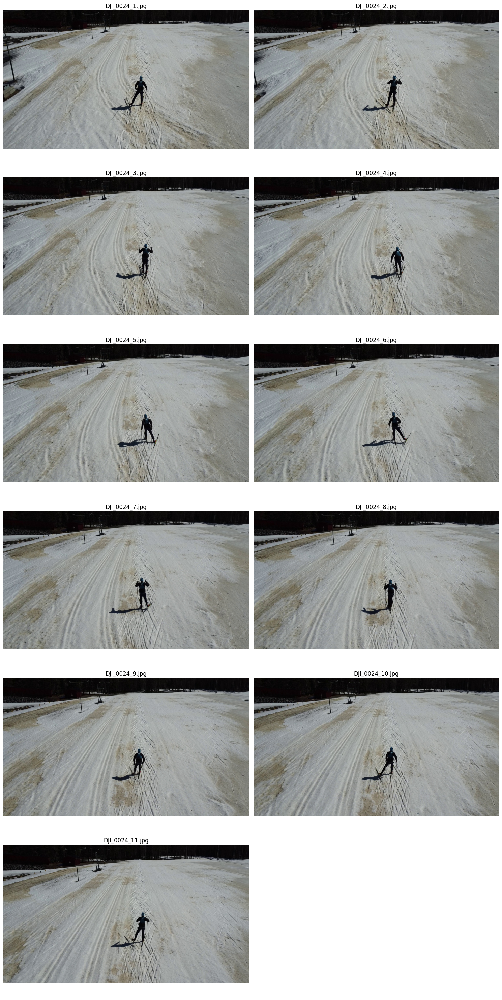

In [19]:
plot_images(sorted_back)

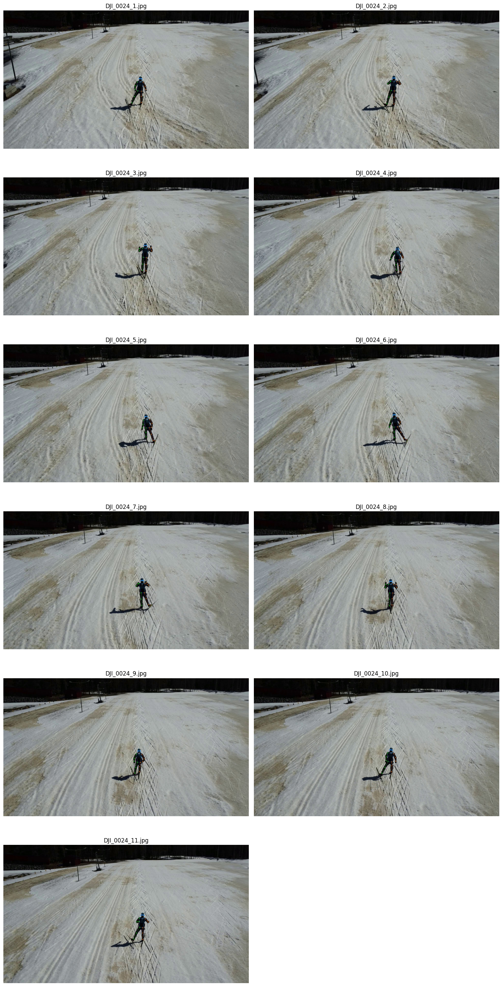

In [21]:
plot_images(sorted_back_annotated)